# Týden 4. Práce se zeměpisnými daty pomocí GeoPandas

GeoPandas, jak název napovídá, rozšiřuje populární knihovnu pandas pro datovou vědu o podporu geoprostorových dat. 

## Instalace

Pro instalaci GeoPandas se doporučuje použít správce balíčků conda. Funkčnost GeoPandas závisí na rozsáhlém souboru geoprostorových knihoven s otevřeným zdrojovým kódem (GEOS, GDAL, PROJ). Tyto základní knihovny jazyka C může být někdy náročné nainstalovat.

### Conda
```
conda install geopandas
```

### Pip
GeoPandas lze také nainstalovat pomocí pip, pokud nainstalujete i všechny jeho závislé [součásti](https://geopandas.org/en/stable/getting_started/install.html#dependencies):

```
pip install geopandas
```

## Datasety

Pro toto cvičení potřebujeme taky nainstalovat balík [Geodatasets](https://pypi.org/project/geodatasets/)

```
conda install geodatasets -c conda-forge
```
```
pip install geodatasets
```

## GeoDataFrame

Základní datovou strukturou v GeoPandas je geopandas.GeoDataFrame, podtřída pandas.DataFrame, která může uchovávat sloupce geometrie a provádět prostorové operace. Geometrie se zpracovávají v rámci struktury `geopandas.GeoSeries`, podtřídy `pandas.Series`. Váš GeoDataFrame je tedy kombinací `pandas.Series` s tradičními daty (číselnými, logickými, textovými atd.) a `geopandas.GeoSeries` s geometriemi (body, polygony atd.).

## Čtení a zápis souborů
Nejprve musíme načíst nějaká data.

### Čtení souborů
Za předpokladu, že máte soubor obsahující data i geometrii (např. GeoPackage, GeoJSON, Shapefile), můžete jej přečíst pomocí funkce `geopandas.read_file()`, která automaticky rozpozná typ souboru a vytvoří GeoDataFrame. Tento návod používá datovou sadu "nybb", mapu městských částí New Yorku, která je k dispozici prostřednictvím balíčku geodatasets. Proto použijeme `geodatasets.get_path()` ke stažení datové sady a získání cesty k lokální kopii.

In [1]:
import geopandas
from geodatasets import get_path

gdf = geopandas.read_file('NUTS_RG_01M_2021_3035.geojson')

gdf

,id,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,FID,geometry
0,CZ,CZ,0,CZ,Česko,Česko,0.0,0,0,CZ,"POLYGON ((4635755.041 3113254.655, 4636313.459..."
1,DE,DE,0,DE,Deutschland,Deutschland,0.0,0,0,DE,"MULTIPOLYGON (((4355225.365 2715902.993, 43541..."
2,DK,DK,0,DK,Danmark,Danmark,0.0,0,0,DK,"MULTIPOLYGON (((4650502.736 3591342.844, 46503..."
3,AL,AL,0,AL,Shqipëria,Shqipëria,0.0,0,0,AL,"MULTIPOLYGON (((5129579.170 2204098.752, 51298..."
4,CY,CY,0,CY,Kýpros,Κύπρος,0.0,0,0,CY,"MULTIPOLYGON (((6527040.718 1762367.593, 65267..."
...,...,...,...,...,...,...,...,...,...,...,...
2005,UKM73,UKM73,3,UK,East Lothian and Midlothian,East Lothian and Midlothian,4.0,1,1,UKM73,"MULTIPOLYGON (((3552262.026 3715465.689, 35521..."
2006,UKM75,UKM75,3,UK,"Edinburgh, City of","Edinburgh, City of",4.0,1,1,UKM75,"MULTIPOLYGON (((3508634.752 3723383.976, 35083..."
2007,UKM76,UKM76,3,UK,Falkirk,Falkirk,4.0,1,1,UKM76,"POLYGON ((3482977.029 3734488.794, 3482998.844..."
2008,UKM78,UKM78,3,UK,West Lothian,West Lothian,4.0,1,1,UKM78,"POLYGON ((3488330.007 3732534.955, 3488153.364..."


Tento dataset [NUTS](https://ec.europa.eu/eurostat/web/gisco/geodata/reference-data/administrative-units-statistical-units/nuts#nuts21) má několik úrovní. NUTS 1: hlavní socioekonomické regiony, NUTS 2: základní regiony pro uplatňování regionálních politik, NUTS 3: malé regiony pro specifické diagnózy. Kromě toho je k dispozici také úroveň NUTS 0, která se obvykle shoduje s hranicemi státu. V tomto cvíčení se zaměříme na úroveň 0.

In [4]:
gdf = gdf[gdf['LEVL_CODE']==0]
gdf

,id,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,FID,geometry
0,CZ,CZ,0,CZ,Česko,Česko,0.0,0,0,CZ,"POLYGON ((4635755.041 3113254.655, 4636313.459..."
1,DE,DE,0,DE,Deutschland,Deutschland,0.0,0,0,DE,"MULTIPOLYGON (((4355225.365 2715902.993, 43541..."
2,DK,DK,0,DK,Danmark,Danmark,0.0,0,0,DK,"MULTIPOLYGON (((4650502.736 3591342.844, 46503..."
3,AL,AL,0,AL,Shqipëria,Shqipëria,0.0,0,0,AL,"MULTIPOLYGON (((5129579.170 2204098.752, 51298..."
4,CY,CY,0,CY,Kýpros,Κύπρος,0.0,0,0,CY,"MULTIPOLYGON (((6527040.718 1762367.593, 65267..."
5,BG,BG,0,BG,Bulgaria,България,0.0,0,0,BG,"POLYGON ((5330611.947 2430822.479, 5332044.063..."
6,AT,AT,0,AT,Österreich,Österreich,0.0,0,0,AT,"MULTIPOLYGON (((4355225.365 2715902.993, 43566..."
7,BE,BE,0,BE,Belgique/België,Belgique/België,0.0,0,0,BE,"MULTIPOLYGON (((3980658.913 3157888.224, 39782..."
8,EE,EE,0,EE,Eesti,Eesti,0.0,0,0,EE,"MULTIPOLYGON (((5209290.379 4151086.253, 52101..."
9,EL,EL,0,EL,Elláda,Ελλάδα,0.0,0,0,EL,"MULTIPOLYGON (((6083864.252 1676459.388, 60836..."


In [1]:
import geopandas
from geodatasets import get_path

path_to_data = get_path("nybb")
gdf = geopandas.read_file(path_to_data)

gdf

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


### Zápis souborů
Pro zápis GeoDataFrame zpět do souboru použijte `GeoDataFrame.to_file()`. Výchozí formát souboru je Shapefile, ale můžete zadat svůj vlastní pomocí klíčového slova driver.

In [5]:
gdf.to_file("my_file.geojson", driver="GeoJSON")

## Jednoduché příkazy a metody
Nyní máme náš GeoDataFrame a můžeme začít pracovat s jeho geometrií.
Protože v datasetu New York Boroughs byl pouze jeden sloupec s geometrií, stane se tento sloupec automaticky aktivní geometrií a prostorové metody použité na GeoDataFrame budou aplikovány na sloupec "geometry".

## Měření plochy
Chcete-li změřit plochu každého polygonu (nebo v tomto konkrétním případě MultiPolygonu), přistupte k atributu `GeoDataFrame.area`, který vrací `pandas.Series`. Všimněte si, že GeoDataFrame.area je pouze `GeoSeries.area` aplikovaný na aktivní sloupec geometrie.

Nejprve však pro snazší přehlednost výsledků nastavte kod zemí jako index:

In [6]:
gdf = gdf.set_index("id")
gdf["area"] = gdf.area
gdf["area"]

id
CZ    7.887326e+10
DE    3.576614e+11
DK    4.317145e+10
AL    2.879967e+10
CY    9.256703e+09
BG    1.109943e+11
AT    8.394492e+10
BE    3.066629e+10
EE    4.534487e+10
EL    1.317594e+11
ES    5.060039e+11
FI    3.375226e+11
FR    6.383649e+11
HR    5.651628e+10
CH    4.128638e+10
HU    9.300909e+10
IE    6.994028e+10
IS    1.026967e+11
IT    3.006502e+11
LV    6.458688e+10
ME    1.388168e+10
MT    3.139037e+08
MK    2.543372e+10
LT    6.489686e+10
LU    2.595982e+09
NL    3.738048e+10
NO    3.867937e+11
SI    2.027172e+10
LI    1.600262e+08
PL    3.119408e+11
RS    7.748778e+10
SE    4.496571e+11
SK    4.902388e+10
TR    7.803730e+11
UK    2.445450e+11
PT    9.190919e+10
RO    2.383685e+11
Name: area, dtype: float64

## Získání hranice polygonu a centroidu
Chcete-li získat hranici každého polygonu (LineString), přistupte k souboru `GeoDataFrame.boundary`:

In [7]:
gdf["boundary"] = gdf.boundary
gdf["boundary"]

id
CZ    LINESTRING (4635755.041 3113254.655, 4636313.4...
DE    MULTILINESTRING ((4355225.365 2715902.993, 435...
DK    MULTILINESTRING ((4650502.736 3591342.844, 465...
AL    MULTILINESTRING ((5129579.170 2204098.752, 512...
CY    MULTILINESTRING ((6527040.718 1762367.593, 652...
BG    LINESTRING (5330611.947 2430822.479, 5332044.0...
AT    MULTILINESTRING ((4355225.365 2715902.993, 435...
BE    MULTILINESTRING ((3980658.913 3157888.224, 397...
EE    MULTILINESTRING ((5209290.379 4151086.253, 521...
EL    MULTILINESTRING ((6083864.252 1676459.388, 608...
ES    MULTILINESTRING ((3815030.229 1904966.807, 381...
FI    MULTILINESTRING ((5073773.420 5207018.495, 507...
FR    MULTILINESTRING ((9981288.972 -3029239.216, 99...
HR    MULTILINESTRING ((4827385.889 2618351.326, 482...
CH    MULTILINESTRING ((4217105.160 2744025.879, 421...
HU    MULTILINESTRING ((5214660.069 2880853.832, 521...
IE    MULTILINESTRING ((3230329.820 3682748.467, 322...
IS    MULTILINESTRING ((2801938.567 4882218.0

Protože jsme uložili hranici jako nový sloupec, máme nyní dva sloupce geometrie ve stejném GeoDataFrame.

Můžeme také vytvořit novou geometrii, kterou může být například buffrovaná verze původní geometrie (tj. `GeoDataFrame.buffer(10)`) nebo její centroid:

In [8]:
gdf["centroid"] = gdf.centroid
gdf["centroid"]

id
CZ    POINT (4705416.775 2973008.314)
DE    POINT (4346999.815 3104769.967)
DK    POINT (4325309.609 3649837.140)
AL    POINT (5166960.521 2059947.001)
CY    POINT (6426479.367 1653535.388)
BG    POINT (5561611.637 2310146.472)
AT    POINT (4631176.247 2728767.351)
BE    POINT (3944215.205 3072471.120)
EE    POINT (5216250.327 4050567.859)
EL    POINT (5446639.549 1866361.242)
ES    POINT (3155885.479 2006106.026)
FI    POINT (5099794.210 4659483.747)
FR    POINT (2913395.917 2360435.730)
HR    POINT (4825477.861 2457529.378)
CH    POINT (4185537.579 2633639.059)
HU    POINT (5031634.960 2717998.076)
IE    POINT (3121334.014 3490934.597)
IS    POINT (3007784.945 4927774.839)
IT    POINT (4502249.567 2181362.865)
LV    POINT (5225132.906 3845732.333)
ME    POINT (5078147.076 2233247.225)
MT    POINT (4721695.260 1440590.207)
MK    POINT (5295735.071 2131106.705)
LT    POINT (5197727.169 3666092.371)
LU    POINT (4039685.956 2970123.974)
NL    POINT (4019193.970 3248343.598)
NO    POI

## Měření vzdálenosti
Můžeme také změřit, jak daleko je každý centroid od polohy prvního centroidu - tedy od středu Česka.

In [9]:
first_point = gdf["centroid"].iloc[0]
gdf["distance"] = gdf["centroid"].distance(first_point)
gdf["distance"]

id
CZ    0.000000e+00
DE    3.818689e+05
DK    7.762594e+05
AL    1.023085e+06
CY    2.168655e+06
BG    1.082800e+06
AT    2.552750e+05
BE    7.676722e+05
EE    1.192512e+06
EL    1.331946e+06
ES    1.826458e+06
FI    1.731974e+06
FR    1.893828e+06
HR    5.292761e+05
CH    6.208429e+05
HU    4.140634e+05
IE    1.666603e+06
IS    2.589028e+06
IT    8.173001e+05
LV    1.015752e+06
ME    8.283564e+05
MT    1.532505e+06
MK    1.028238e+06
LT    8.501382e+05
LU    6.657371e+05
NL    7.393993e+05
NO    1.856186e+06
SI    4.047715e+05
LI    5.166338e+05
PL    3.897556e+05
RS    7.399672e+05
SE    1.406497e+06
SK    3.218924e+05
TR    1.943567e+06
UK    1.330314e+06
PT    2.181425e+06
RO    8.407287e+05
Name: distance, dtype: float64

Uvědomte si, že geopandas.GeoDataFrame je podtřídou pandas.DataFrame, takže máme k dispozici všechny funkce pandas, které můžeme použít na sadě geoprostorových dat - můžeme dokonce provádět manipulace s daty společně s atributy a informacemi o geometrii.
Chceme-li například vypočítat průměr výše naměřených vzdáleností, přistoupíme ke sloupci 'distance' a zavoláme nad ním metodu `mean()`:


In [10]:
gdf["distance"].mean()

1071927.3069375774

## Tvorba map
GeoPandas umí také vykreslovat mapy. Chcete-li vykreslit aktivní geometrii, zavolejte `GeoDataFrame.plot()`. Chcete-li vybarvit podle jiného sloupce, předejte tento sloupec jako první argument. V následujícím příkladu vykreslíme sloupec aktivní geometrie a barevně označíme sloupec "area". Chceme také zobrazit legendu (`legend=True`).

<Axes: >

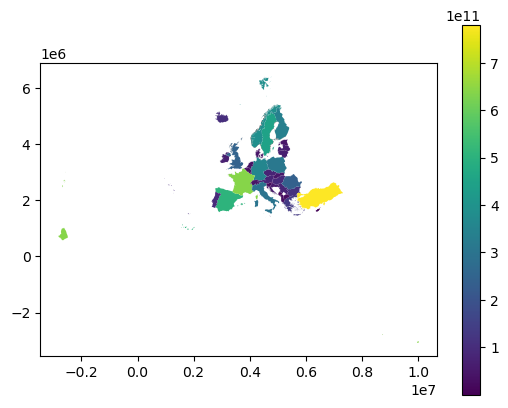

In [11]:
gdf.plot("area", legend=True)

Data můžete také interaktivně prozkoumat pomocí funkce `GeoDataFrame.explore()`, která se chová stejně jako funkce `plot()`, ale místo toho vrací interaktivní mapu.

In [12]:
gdf.explore("area", legend=False)

Přepnutím aktivní geometrie (`GeoDataFrame.set_geometry`) na centroidy můžeme vykreslit stejná data pomocí bodové geometrie.

<Axes: >

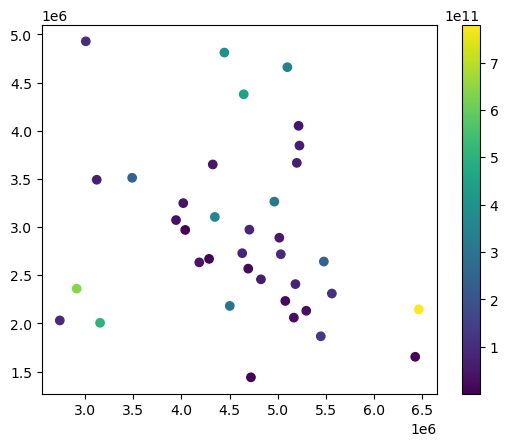

In [13]:
gdf = gdf.set_geometry("centroid")
gdf.plot("area", legend=True)

Obě řady GeoSeries můžeme také vrstvit na sebe. Stačí, když jeden graf použijeme jako osu pro druhý.

<Axes: >

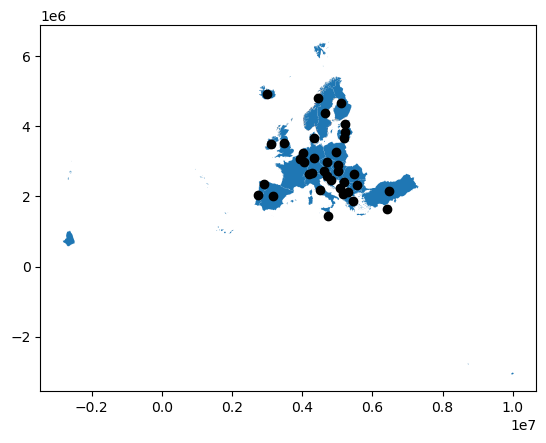

In [14]:
ax = gdf["geometry"].plot()
gdf["centroid"].plot(ax=ax, color="black")

Nyní nastavíme aktivní geometrii zpět na původní `GeoSeries`.

In [15]:
gdf = gdf.set_geometry("geometry")

## Vytváření geometrie
S geometrií můžeme dále pracovat a vytvářet nové tvary na základě těch, které již máme.

### Konvexní obal
Pokud nás zajímá konvexní obal našich polygonů, můžeme přistupovat k souboru `GeoDataFrame.convex_hull`.

<Axes: >

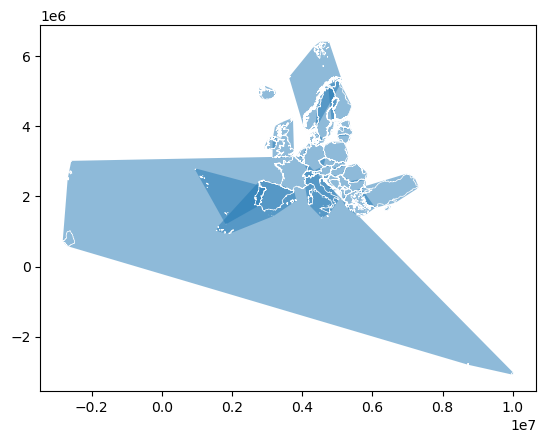

In [16]:
gdf["convex_hull"] = gdf.convex_hull
ax = gdf["convex_hull"].plot(alpha=0.5)
gdf["boundary"].plot(ax=ax, color="white", linewidth=0.5)

### Nárazníky
V jiných případech můžeme potřebovat bufferovat geometrii pomocí funkce `GeoDataFrame.buffer()`. Metody geometrie se automaticky aplikují na aktivní geometrii, ale můžeme je použít i přímo na libovolnou řadu GeoSeries. Nárazníky vytvoříme pro hranice statů a jejich centroidy a vykreslíme obojí nad sebou.

<Axes: >

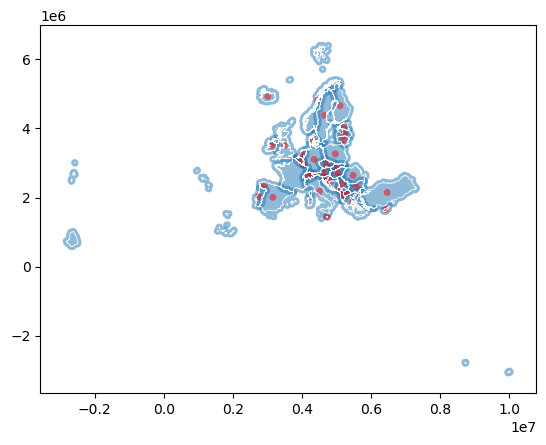

In [23]:
gdf["buffered"] = gdf.buffer(100000)
gdf["buffered_centroid"] = gdf["centroid"].buffer(100000)

ax = gdf["buffered"].plot(alpha=0.5)
gdf["buffered_centroid"].plot(ax=ax, color="red", alpha=0.5)
gdf["boundary"].plot(ax=ax, color="white", linewidth=0.5)

## Geometrické vztahy
Můžeme se také ptát na prostorové vztahy různých geometrií. Pomocí výše uvedených geometrií můžeme zkontrolovat, které z buferovaných hranic statů protínají původní geometrii Česka, tj. nacházejí se do vzdálenosti 100 km od Česka.

Nejprve získáme polygon Česka.

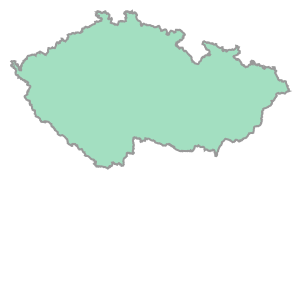

In [20]:
czechia = gdf.loc["CZ", "geometry"]
czechia

Polygon je tvarový geometrický objekt, stejně jako každá jiná geometrie používaná v GeoPandas.

In [24]:
type(czechia)

shapely.geometry.polygon.Polygon

Pak můžeme zkontrolovat, která z geometrií v `gdf["buffered"]` ji protíná.

In [25]:
gdf["buffered"].intersects(czechia)

id
CZ     True
DE     True
DK    False
AL    False
CY    False
BG    False
AT     True
BE    False
EE    False
EL    False
ES    False
FI    False
FR    False
HR    False
CH    False
HU     True
IE    False
IS    False
IT    False
LV    False
ME    False
MT    False
MK    False
LT    False
LU    False
NL    False
NO    False
SI    False
LI    False
PL     True
RS    False
SE    False
SK     True
TR    False
UK    False
PT    False
RO    False
dtype: bool

Pouze sousední staty protínají náš polygon.

Případně můžeme zkontrolovat, které nárazníkové centroidy jsou zcela uvnitř původních polygonů statů. V tomto případě jsou oba geosouřadnice zarovnány a kontrola se provádí pro každý řádek.

In [26]:
gdf["within"] = gdf["buffered_centroid"].within(gdf)
gdf["within"]

id
CZ    False
DE     True
DK    False
AL    False
CY    False
BG    False
AT    False
BE    False
EE    False
EL    False
ES     True
FI    False
FR    False
HR    False
CH    False
HU    False
IE    False
IS    False
IT    False
LV    False
ME    False
MT    False
MK    False
LT    False
LU    False
NL    False
NO    False
SI    False
LI    False
PL     True
RS    False
SE    False
SK    False
TR     True
UK    False
PT    False
RO     True
Name: within, dtype: bool

Výsledky můžeme zakreslit do mapy a potvrdit tak zjištění.

<Axes: >

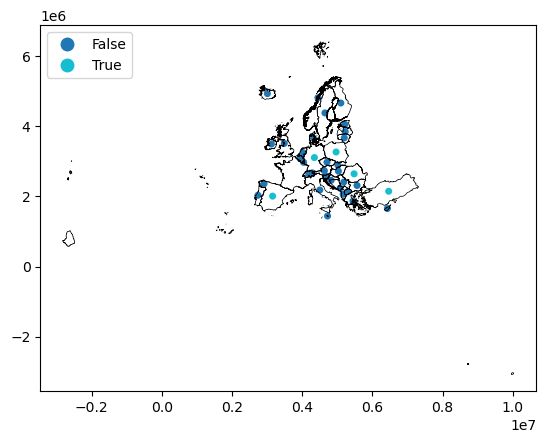

In [27]:
gdf = gdf.set_geometry("buffered_centroid")

ax = gdf.plot(
    "within", legend=True, categorical=True, legend_kwds={"loc": "upper left"}
)
gdf["boundary"].plot(ax=ax, color="black", linewidth=0.5)

## Projekce
Každá geosérie má svůj souřadnicový referenční systém (CRS) přístupný na adrese GeoSeries.crs. CRS říká programu GeoPandas, kde se nacházejí souřadnice geometrií na zemském povrchu. V některých případech je CRS geografický, což znamená, že souřadnice jsou v zeměpisné šířce a délce. V těchto případech je jeho CRS WGS84 s kódem autority EPSG:4326. Podívejme se na projekci našeho datasetu.

In [28]:
gdf.crs

<Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Türkiye (Turkey); United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Eur

Geometrie jsou v EPSG:3035 se souřadnicemi ve metrech. GeoSeries můžeme snadno přeprojektovat do jiného CRS, například EPSG:4326, pomocí `GeoSeries.to_crs()`.

<Axes: >

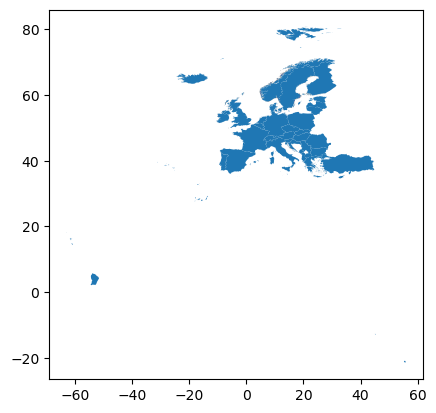

In [29]:
gdf = gdf.set_geometry("geometry")
Europe_4326 = gdf.to_crs("EPSG:4326")
Europe_4326.plot()

In [30]:
Europe_4326.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Všimněte si rozdílu souřadnic podél os grafu. Tam, kde jsme předtím měli -3 000 000 - 6 000 000 (metrů), máme nyní -25 - 75 (stupňů). V tomto případě má Europe_4326 sloupec "geometrie" ve WGS84, ale všechny ostatní (s centroidy atd.) zůstávají v původním CRS.

Pro operace, které se opírají o vzdálenost nebo plochu, je vždy nutné použít promítnutý CRS (v metrech, kilometrech atd.), nikoli geografický (ve stupních). Operace GeoPandas jsou rovinné, zatímco stupně odrážejí polohu na kouli. Proto prostorové operace s použitím stupňů nemusí přinést správné výsledky. 